In [159]:
import pandas as pd
from rdkit.Chem import AllChem as Chem
from rdkit.Chem.Scaffolds.MurckoScaffold import GetScaffoldForMol
from rdkit.Chem.Scaffolds.MurckoScaffold import MakeScaffoldGeneric
from rdkit.Chem.Draw import MolsToGridImage, IPythonConsole, MolToImage
from rdkit.Chem.Draw import rdMolDraw2D
from io import BytesIO
import base64
from IPython.core.display import HTML
from scipy.spatial import distance
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from rdkit.Chem.rdMolDescriptors import MQNs_
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

In [2]:
# upload the vasopressin dataset
data = pd.read_csv("data/chembl_Vasopressin_V1a_receptor_KI.csv", delimiter = ";")

smiles = data["Smiles"]
smiles.fillna("", inplace = True)
molecules = [Chem.MolFromSmiles(smile) for smile in smiles]
data["molecule"] = molecules

# add Morgan fingerprints to the dataframe
data["morgan_fingerprint"] = data["molecule"].apply(Chem.GetMorganFingerprintAsBitVect, args = (2, ), nBits = 1024)

In [3]:
# upload the drugbank dataset
drugbank = [m for m in Chem.SDMolSupplier("../data/drugbank.sdf") if m]

RDKit ERROR: [08:54:12] Explicit valence for atom # 7 N, 4, is greater than permitted
RDKit ERROR: [08:54:12] ERROR: Could not sanitize molecule ending on line 20009
[08:54:12] Explicit valence for atom # 7 N, 4, is greater than permitted
[08:54:12] ERROR: Could not sanitize molecule ending on line 20009
RDKit ERROR: [08:54:12] ERROR: Explicit valence for atom # 7 N, 4, is greater than permitted
[08:54:12] ERROR: Explicit valence for atom # 7 N, 4, is greater than permitted
[08:54:13] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10

RDKit ERROR: [08:54:13] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10
RDKit ERROR: 
RDKit ERROR: [08:54:13] ERROR: Could not sanitize molecule ending on line 250947
[08:54:13] ERROR: Could not sanitize molecule ending on line 250947
RDKit ERROR: [08:54:13] ERROR: Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10
[08:54:13] ERROR: Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10

[08:54:13] Explicit valence for atom

[08:54:13] ERROR: Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7

[08:54:13] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13

RDKit ERROR: 
RDKit ERROR: [08:54:13] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
RDKit ERROR: 
RDKit ERROR: [08:54:13] ERROR: Could not sanitize molecule ending on line 357505
[08:54:13] ERROR: Could not sanitize molecule ending on line 357505
RDKit ERROR: [08:54:13] ERROR: Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[08:54:13] ERROR: Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13

[08:54:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7

RDKit ERROR: 
RDKit ERROR: [08:54:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
RDKit ERROR: 
RDKit ERROR: [08:54:13] ERROR: Could not sanitize molecule ending on line 371006
[08:54:13] ERROR: Could not sanitize molecule ending on line 371006
RDKit ERROR: [08:54:13] ERROR: Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
RDKit ERROR: 
RDKit ERROR:

RDKit ERROR: [08:54:14] ERROR: Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10
[08:54:14] ERROR: Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10

[08:54:14] Explicit valence for atom # 2 O, 3, is greater than permitted
RDKit ERROR: 
RDKit ERROR: [08:54:14] Explicit valence for atom # 2 O, 3, is greater than permitted
RDKit ERROR: [08:54:14] ERROR: Could not sanitize molecule ending on line 519056
[08:54:14] ERROR: Could not sanitize molecule ending on line 519056
RDKit ERROR: [08:54:14] ERROR: Explicit valence for atom # 2 O, 3, is greater than permitted
RDKit ERROR: [08:54:14] Explicit valence for atom # 6 B, 4, is greater than permitted
[08:54:14] ERROR: Explicit valence for atom # 2 O, 3, is greater than permitted
[08:54:14] Explicit valence for atom # 6 B, 4, is greater than permitted
RDKit ERROR: [08:54:14] ERROR: Could not sanitize molecule ending on line 541262
[08:54:14] ERROR: Could not sanitize molecule ending on line 541262
RDKit ERROR: [08:54:14] ERROR

RDKit ERROR: [08:54:15] ERROR: Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 5 6 7 8 9 10
[08:54:15] ERROR: Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 5 6 7 8 9 10

[08:54:16] Explicit valence for atom # 0 Be, 3, is greater than permitted
RDKit ERROR: 
RDKit ERROR: [08:54:16] Explicit valence for atom # 0 Be, 3, is greater than permitted
RDKit ERROR: [08:54:16] ERROR: Could not sanitize molecule ending on line 995692
[08:54:16] ERROR: Could not sanitize molecule ending on line 995692
RDKit ERROR: [08:54:16] ERROR: Explicit valence for atom # 0 Be, 3, is greater than permitted
[08:54:16] ERROR: Explicit valence for atom # 0 Be, 3, is greater than permitted
[08:54:17] Explicit valence for atom # 0 C greater than permitted
RDKit ERROR: [08:54:17] Explicit valence for atom # 0 C greater than permitted
RDKit ERROR: [08:54:17] ERROR: Could not sanitize molecule ending on line 1151592
[08:54:17] ERROR: Could not sanitize molecule ending on line 1151592


In [4]:
# create the drugbank dataframe
drugbank_morgan_fingerprint = [Chem.GetMorganFingerprintAsBitVect(m, 2, nBits = 1024) for m in drugbank]
drugbank_formulas = [m.GetProp("FORMULA") for m in drugbank]
drugbank_generics = [m.GetProp("GENERIC_NAME") for m in drugbank]

drugbank_df = pd.DataFrame([drugbank_formulas, drugbank_generics, drugbank, drugbank_morgan_fingerprint]).transpose()
drugbank_df.columns = ["formula", "generic_name", "molecule", "morgan_fingerprint"]

In [5]:
# function to return the silimarity index of two bit vectors
def tanimoto_index(bit_vector1, bit_vector2):
    intersect = [bit1 and bit2 for bit1, bit2 in zip(bit_vector1, bit_vector2)]
    union = [bit1 or bit2 for bit1, bit2 in zip(bit_vector1, bit_vector2)]
    try:
        index = sum(intersect) / sum(union)
    except ZeroDivisionError:
        return 0
    return index

## Scaffolds

In [6]:
# create three different levels of scaffolds for the vasopressin dataset
data["scaffold"] = data["molecule"].apply(GetScaffoldForMol)
data["scaffold_generic"] = data["scaffold"].apply(MakeScaffoldGeneric)
data["scaffold_scaffold_generic"] = data["scaffold_generic"].apply(GetScaffoldForMol)

In [7]:
def third_scaffold_drugbank(molecule):
    Chem.rdmolops.RemoveStereochemistry(molecule)
    scaffold = GetScaffoldForMol(molecule)
    try:
        scaffold_generic = MakeScaffoldGeneric(scaffold)
    except ValueError:
        return None
    
    try:
        scaffold_scaffold_generic = GetScaffoldForMol(scaffold_generic)
    except ValueError:
        return None
    
    return scaffold_scaffold_generic

In [8]:
drugbank_df["scaffold_scaffold_generic"] = drugbank_df["molecule"].apply(third_scaffold_drugbank)

RDKit ERROR: [08:54:17] ERROR: Explicit valence for atom # 0 C greater than permitted
[08:54:17] ERROR: Explicit valence for atom # 0 C greater than permitted
[08:54:20] Explicit valence for atom # 48 C, 5, is greater than permitted
RDKit ERROR: [08:54:20] Explicit valence for atom # 48 C, 5, is greater than permitted
RDKit ERROR: [08:54:20] Explicit valence for atom # 41 C, 5, is greater than permitted
[08:54:20] Explicit valence for atom # 41 C, 5, is greater than permitted
RDKit ERROR: [08:54:22] Explicit valence for atom # 30 C, 6, is greater than permitted
[08:54:22] Explicit valence for atom # 30 C, 6, is greater than permitted
RDKit ERROR: [08:54:22] Explicit valence for atom # 14 C, 10, is greater than permitted
[08:54:22] Explicit valence for atom # 14 C, 10, is greater than permitted
RDKit ERROR: [08:54:24] Explicit valence for atom # 28 C, 5, is greater than permitted
[08:54:24] Explicit valence for atom # 28 C, 5, is greater than permitted
RDKit ERROR: [08:54:24] Explicit v

In [9]:
data["scaffold_smiles"] = data["scaffold_scaffold_generic"].apply(Chem.MolToSmiles)

In [10]:
drugbank_df["scaffold_smiles"] = [Chem.MolToSmiles(mol) if mol else None for mol in drugbank_df["scaffold_scaffold_generic"]]

In [11]:
data_scaffold_counts = data["scaffold_smiles"].value_counts()
data_scaffold_counts = data_scaffold_counts.sort_values(ascending = False)

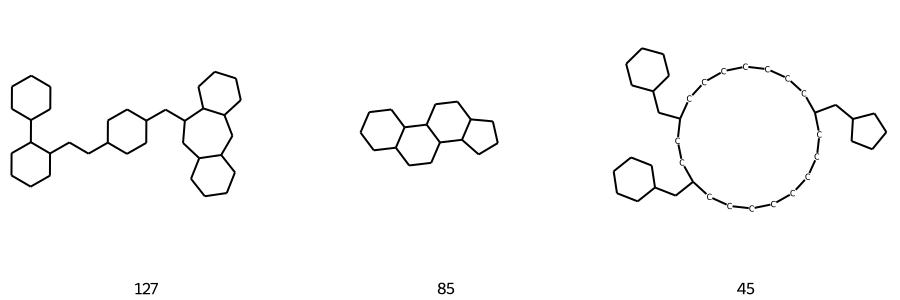

In [12]:
# visualize second to fifth most common scaffolds
legend = [str(v) for v in data_scaffold_counts.values]
to_draw = [Chem.MolFromSmiles(m) for m in data_scaffold_counts.index]
to_draw = [m for m in to_draw if m]
# MolToImage(to_draw[0])
MolsToGridImage(to_draw[2:5], subImgSize = (300, 300), legends = legend)

In [13]:
data_top_ten_scaffold_smiles = data_scaffold_counts.index[:10]
data["top_ten_scaffolds"] = data["scaffold_smiles"].apply(str).isin(data_top_ten_scaffold_smiles)

In [14]:
drugbank_scaffold_counts = drugbank_df["scaffold_smiles"].value_counts()
drugbank_scaffold_counts = drugbank_scaffold_counts.sort_values(ascending = False)

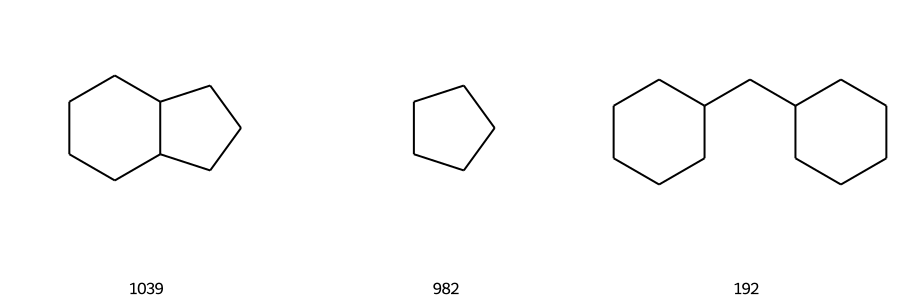

In [15]:
# visualize second to fifth most common scaffolds
legend = [str(v) for v in drugbank_scaffold_counts.values]
to_draw = [Chem.MolFromSmiles(m) for m in drugbank_scaffold_counts.index]
to_draw = [m for m in to_draw if m]
MolsToGridImage(to_draw[2:5], subImgSize = (300, 300), legends = legend)

## Visualize molecules in dataframe

In [16]:
def mol2display_png(mol):
    """Format RDKit mol for direct inline display."""
    d2d = rdMolDraw2D.MolDraw2DCairo(400, 400)
    d2d.DrawMolecule(mol)
    d2d.FinishDrawing()
    buffer = BytesIO(d2d.GetDrawingText())
    return f'<img src="data:image/png;base64,{base64.b64encode(buffer.getvalue()).decode()}">'

,Molecule ChEMBL ID,Molecule Name,Molecule Max Phase,Molecular Weight,#RO5 Violations,AlogP,Compound Key,Smiles,Standard Type,Standard Relation,Standard Value,Standard Units,pChEMBL Value,Data Validity Comment,Comment,Uo Units,Ligand Efficiency BEI,Ligand Efficiency LE,Ligand Efficiency LLE,Ligand Efficiency SEI,Potential Duplicate,Assay ChEMBL ID,Assay Description,Assay Type,BAO Format ID,BAO Label,Assay Organism,Assay Tissue ChEMBL ID,Assay Tissue Name,Assay Cell Type,Assay Subcellular Fraction,Assay Parameters,Assay Variant Accession,Assay Variant Mutation,Target ChEMBL ID,Target Name,Target Organism,Target Type,Document ChEMBL ID,Source ID,Source Description,Document Journal,Document Year,Cell ChEMBL ID,Properties,molecule,morgan_fingerprint,scaffold,scaffold_generic,scaffold_scaffold_generic,scaffold_smiles,top_ten_scaffolds
0,CHEMBL1085301,NaN,0,403.52,1,6.15,13a,COc1cc(C(=O)N2C[C@]3(C)C[C@H]2CC(C)(C)C3)ccc1-c1coc2ccccc12,Ki,'=',3.80,nM,8.42,NaN,NaN,UO_0000065,20.87,0.38,2.27,19.73,False,CHEMBL1120488,Displacement [3H]Arg human recombinant Vasopressin V1a receptor,B,BAO_0000357,single protein format,Homo sapiens,None,None,None,None,NaN,NaN,NaN,CHEMBL1889,Vasopressin V1a receptor,Homo sapiens,SINGLE PROTEIN,CHEMBL1155536,1,Scientific Literature,Bioorg. Med. Chem. Lett.,2010.0,None,NaN,,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...]",,,,C1CC2CC(C1)C(CC1CCC(C3CCC4CCCCC43)CC1)C2,False
1,CHEMBL1084008,NaN,0,402.54,1,5.88,13f,COc1cc(C(=O)N2C[C@]3(C)C[C@H]2CC(C)(C)C3)ccc1-c1c[nH]c2ccccc12,Ki,'=',0.10,nM,10.00,NaN,NaN,UO_0000065,24.84,0.46,4.12,22.06,False,CHEMBL1120488,Displacement [3H]Arg human recombinant Vasopressin V1a receptor,B,BAO_0000357,single protein format,Homo sapiens,None,None,None,None,NaN,NaN,NaN,CHEMBL1889,Vasopressin V1a receptor,Homo sapiens,SINGLE PROTEIN,CHEMBL1155536,1,Scientific Literature,Bioorg. Med. Chem. Lett.,2010.0,None,NaN,,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...]",,,,C1CC2CC(C1)C(CC1CCC(C3CCC4CCCCC43)CC1)C2,False
2,CHEMBL4173250,NaN,0,524.63,1,3.99,3c,Cn1ncc2c1Nc1ccccc1N(C(=O)Cc1ccc(N3CCN(Cc4cc(O)cc(O)c4)CC3)cc1)C2,Ki,'=',795.10,nM,6.10,NaN,NaN,UO_0000065,11.63,0.21,2.11,6.28,False,CHEMBL4141652,Displacement of [3H]-vasopressin from human vasopressin V1a receptor expressed in HEK293 cell membranes after 90 mins by radioligand binding assay,B,BAO_0000219,cell-based format,Homo sapiens,None,None,HEK293,None,NaN,NaN,NaN,CHEMBL1889,Vasopressin V1a receptor,Homo sapiens,SINGLE PROTEIN,CHEMBL4138154,1,Scientific Literature,Eur J Med Chem,2018.0,None,NaN,,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...]",,,,C1CCC(CC2CCC(C3CCC(CCC4CC5CCCC5CC5CCCCC54)CC3)CC2)CC1,False
3,CHEMBL382301,ATOSIBAN,4,994.21,3,-3.04,Atosiban,CCOc1ccc(C[C@H]2NC(=O)CCSSC[C@@H](C(=O)N3CCC[C@H]3C(=O)N[C@@H](CCCN)C(=O)NCC(N)=O)NC(=O)[C@H](CC(N)=O)NC(=O)[C@H]([C@@H](C)O)NC(=O)[C@H]([C@@H](C)CC)NC2=O)cc1,Ki,'=',0.15,nM,9.82,NaN,NaN,UO_0000065,9.88,0.20,12.86,2.69,False,CHEMBL946023,Binding affinity to human vasopressin V1a receptor,B,BAO_0000357,single protein format,Homo sapiens,None,None,None,None,NaN,NaN,NaN,CHEMBL1889,Vasopressin V1a receptor,Homo sapiens,SINGLE PROTEIN,CHEMBL1142309,1,Scientific Literature,Bioorg. Med. Chem. Lett.,2008.0,None,NaN,,"[0, 1, 0, 0, 1, 
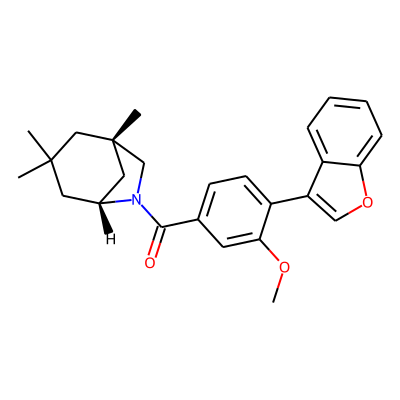
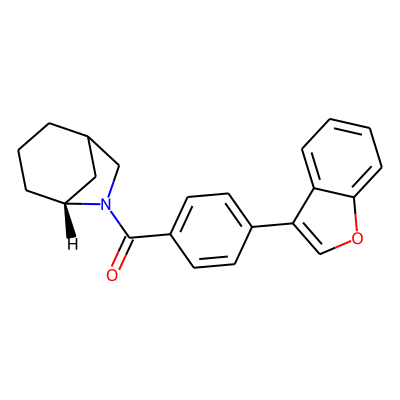
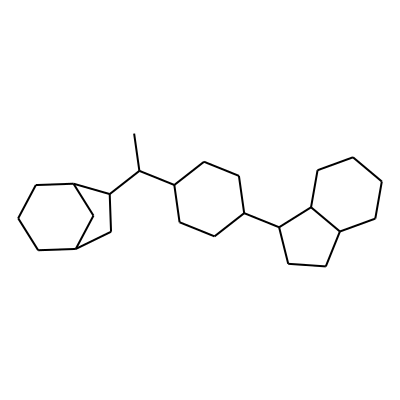
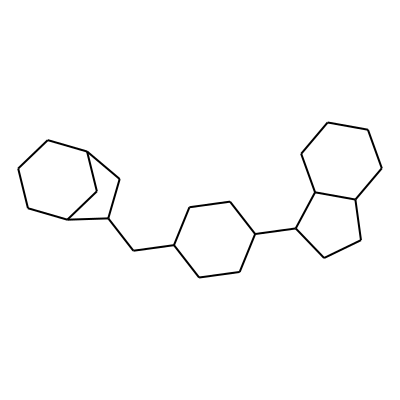
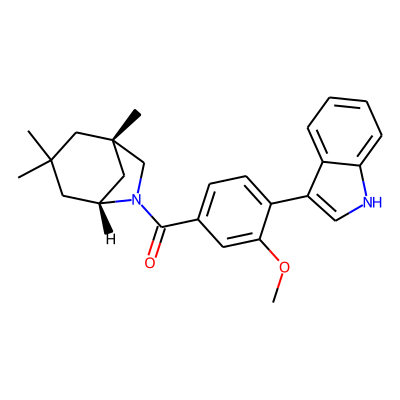
...
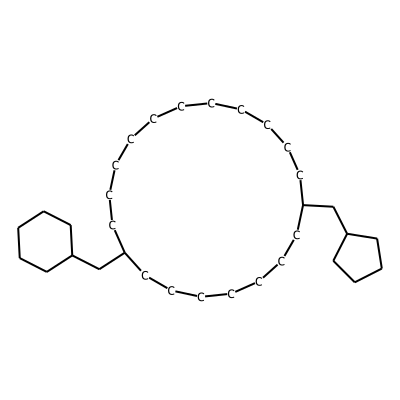
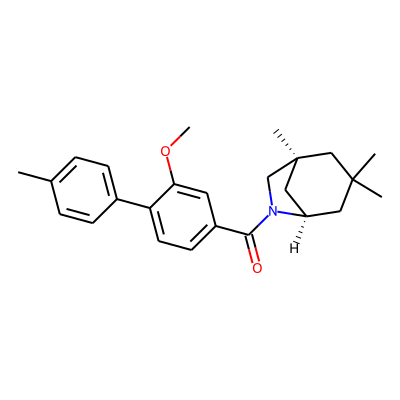
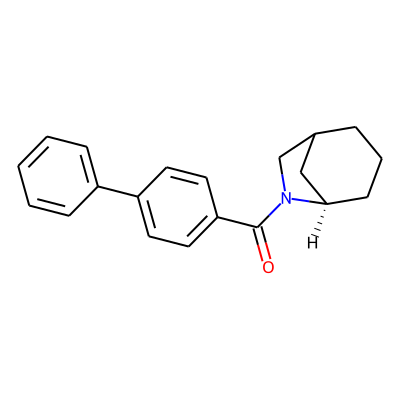
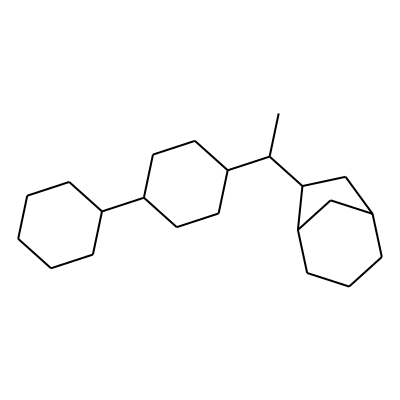
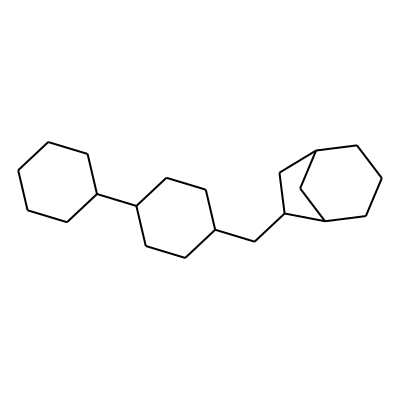

In [17]:
HTML(data.head().to_html(formatters = {"molecule": mol2display_png, "scaffold": mol2display_png, "scaffold_generic": mol2display_png, "scaffold_scaffold_generic": mol2display_png}, escape = False))

,molecule,scaffold_scaffold_generic,scaffold_smiles
0,,,C1CC2CC(C1)C(CC1CCC(C3CCC4CCCCC43)CC1)C2
1,,,C1CC2CC(C1)C(CC1CCC(C3CCC4CCCCC43)CC1)C2
2,,,C1CCC(CC2CCC(C3CCC(CCC4CC5CCCC5CC5CCCCC54)CC3)CC2)CC1
3,,,C1CCCCCC(CC2CCCCC2)CCCCCCCC(CC2CCCC2)CCCCC1
4,,,C1CCC(C2CCC(CC3CC4CCCC3C4)CC2)CC1

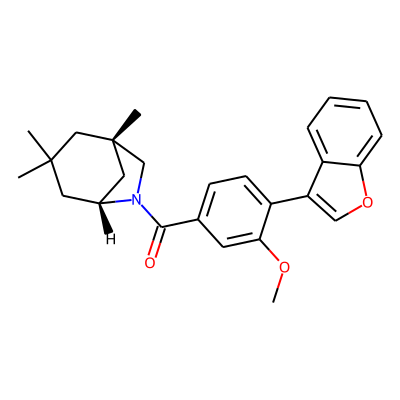
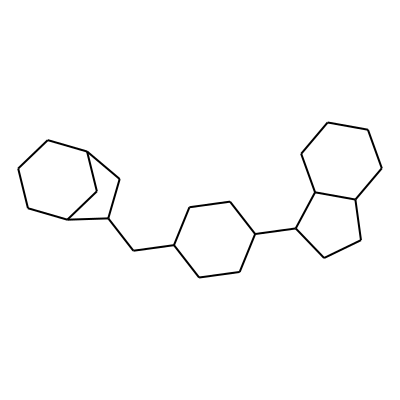
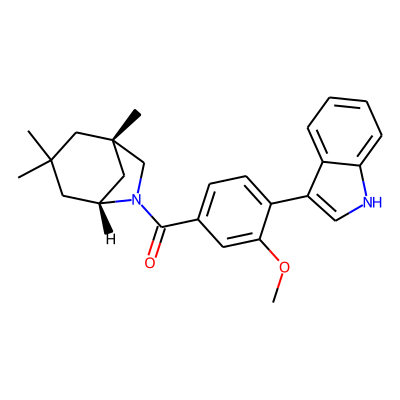
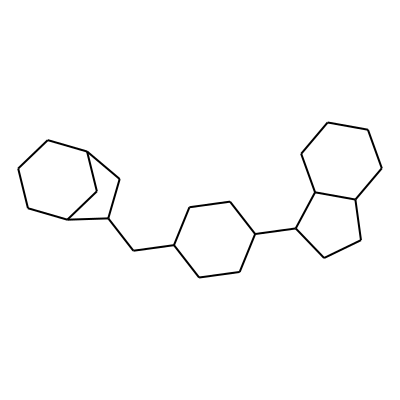
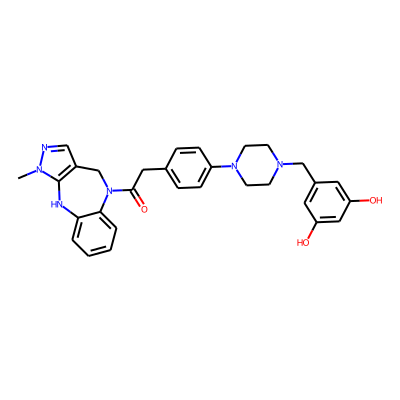
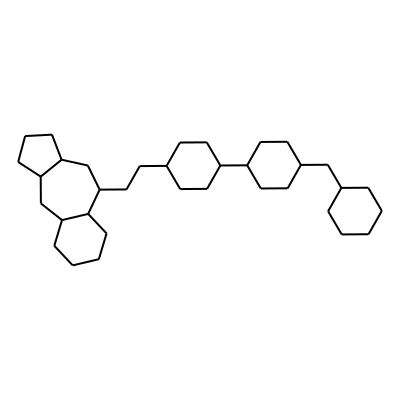
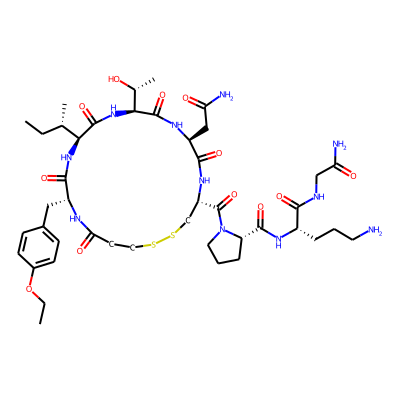
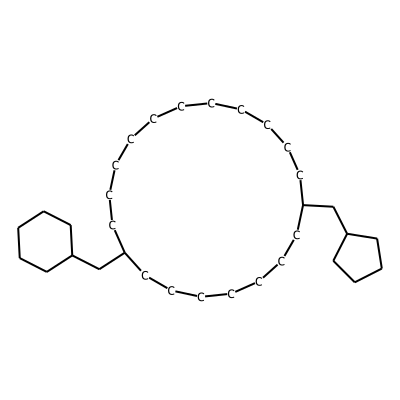
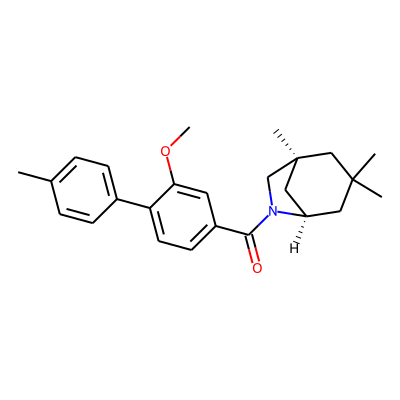
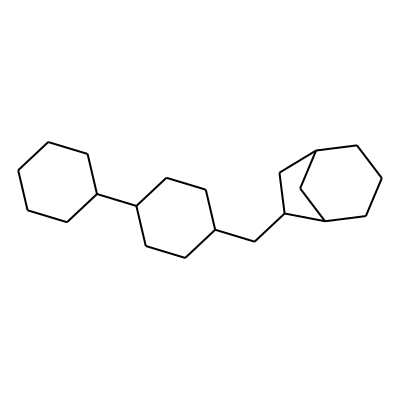

In [18]:
HTML(data[["molecule", "scaffold_scaffold_generic", "scaffold_smiles"]].head().to_html(formatters = {"molecule": mol2display_png, "scaffold_scaffold_generic": mol2display_png}, escape = False))

,molecule,scaffold_scaffold_generic,scaffold_smiles
0,,,C(CCCCCCCCCCCC(CCCCCCCCCCC1CCCC1CCCCCCCCCCC1CCCCC1)CC1CCCCC1)CCCCCCCCCCCC1CCCC1CCCCC1CCCC1CCCC1CCCCC1
1,,,C(CCCCCC(CCCCCC(CCC(CCC1CCCC1)CC1CCCC1)CC1CCC2CCCCC21)CC1CCCCC1)CCCCC1CCCC1
2,,,C1CCCCC(CC2CCCCC2)CCC(CC2CCCCC2)CCCCCCCC(CC2CCCC2)CCC1
3,,,C(CCCCCC(CCCCCC(CCC(CCCCC1CCC2CCCCC2C1)CC1CCCCC1)CC1CCCCC1)CC1CCCCC1)CCCCC1CCCC1
4,,,C1CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC1

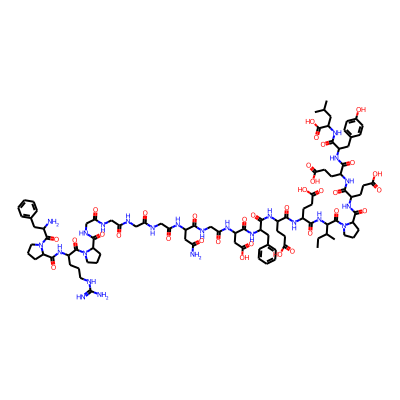
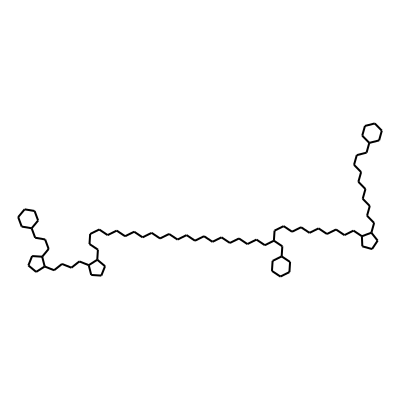
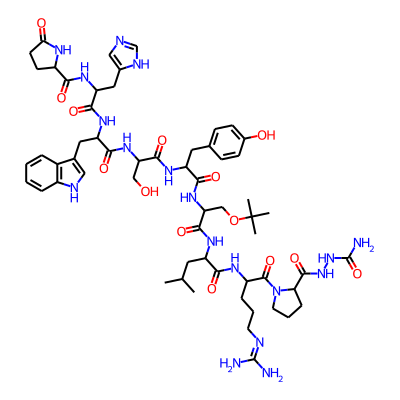
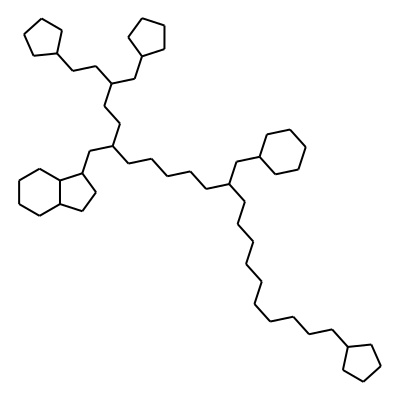
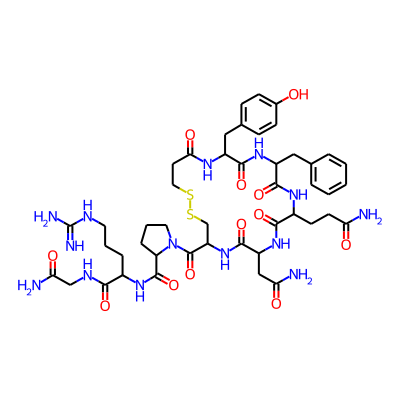
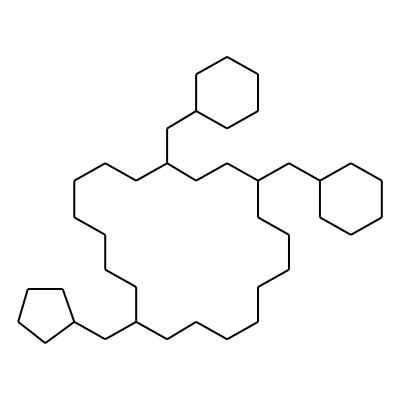
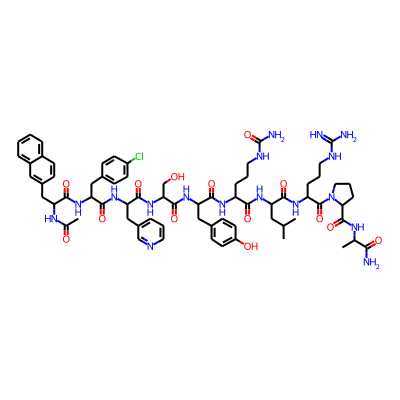
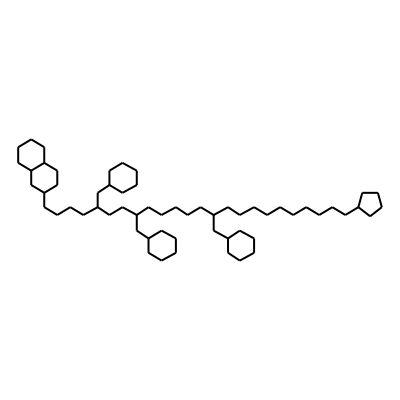
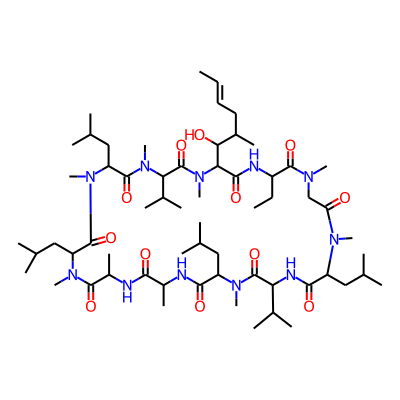
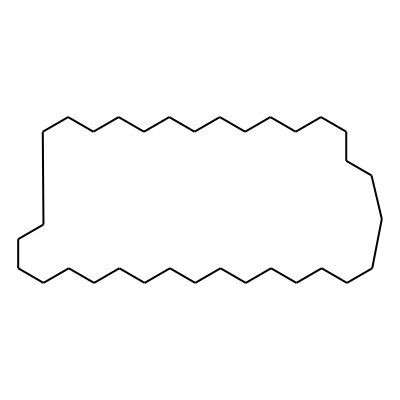

In [19]:
HTML(drugbank_df[["molecule", "scaffold_scaffold_generic", "scaffold_smiles"]].head().to_html(formatters = {"molecule": mol2display_png, "scaffold_scaffold_generic": mol2display_png}, escape = False))

## Count scaffolds and compare their occurence ratios

In [20]:
data_scaffold_counts = pd.DataFrame(data["scaffold_smiles"].value_counts())
data_scaffold_counts["molecule"] = data_scaffold_counts.index.map(Chem.MolFromSmiles)
data_scaffold_counts

,scaffold_smiles,molecule
C1CCCCC1,127,<rdkit.Chem.rdchem.Mol object at 0x7f8dd4a92f80>
,85,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40cee0>
C1CCC(C2CCCCC2CCC2CCC(CC3CC4CCCCC4CC4CCCCC43)CC2)CC1,45,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40cc60>
C1CCC2C(C1)CCC1C3CCCC3CCC21,43,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40cda0>
C1CCCCC(CC2CCCCC2)CCC(CC2CCCCC2)CCCCCCCC(CC2CCCC2)CCC1,41,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd946c10>
...,...,...
C(CCCCCC1CCCC1CCCCCCCC1CCCCC1)CCCCC(CCC(CCC1CCC(CC2CCCCC2)CC1)CC1CCCCC1)CC1CCCCC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd964f80>
C1CCC(CCCC2CCC(CC3CCC(C4CCCC5CCCCC54)CC3)CC2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd965030>
C1CCC(CCC2CCC(CC3CCC(C4CCCC5CCCCC54)CC3)CC2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd965080>
C1CCC(CCCC(CC2CCC(CCC3CCCCC3)CC2)C2CC(C3CCCC3C3CCCCC3)C2CCC2CCCCC2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd9650d0>


,scaffold_smiles,molecule
C1CCCCC1,127,
,85,
C1CCC(C2CCCCC2CCC2CCC(CC3CC4CCCCC4CC4CCCCC43)CC2)CC1,45,
C1CCC2C(C1)CCC1C3CCCC3CCC21,43,
C1CCCCC(CC2CCCCC2)CCC(CC2CCCCC2)CCCCCCCC(CC2CCCC2)CCC1,41,

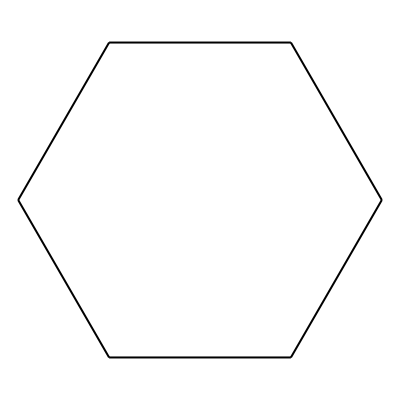
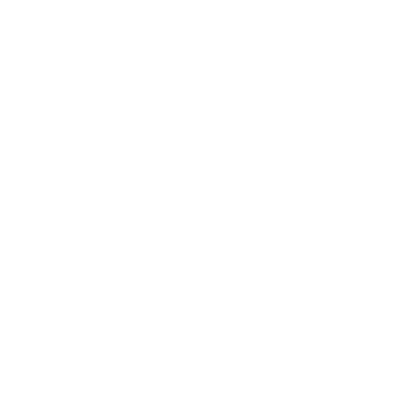
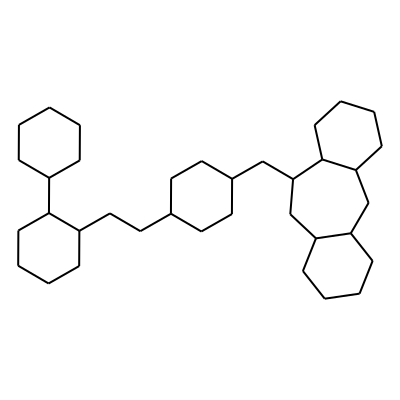
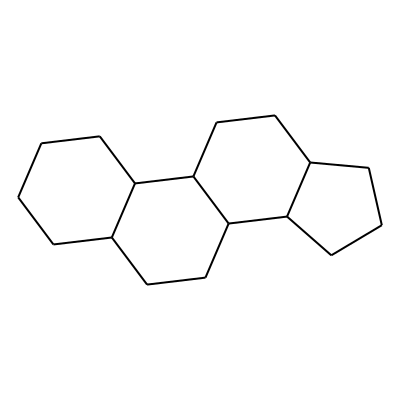
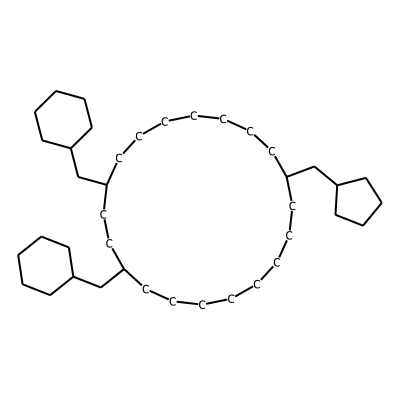

In [21]:
HTML(data_scaffold_counts.head().to_html(formatters = {"molecule": mol2display_png}, escape = False))

In [22]:
data_scaffold_counts["scaffold_probability"] = data_scaffold_counts["scaffold_smiles"].apply(lambda x: (x / len(data)) * 100)
data_scaffold_counts

,scaffold_smiles,molecule,scaffold_probability
C1CCCCC1,127,<rdkit.Chem.rdchem.Mol object at 0x7f8dd4a92f80>,7.396622
,85,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40cee0>,4.950495
C1CCC(C2CCCCC2CCC2CCC(CC3CC4CCCCC4CC4CCCCC43)CC2)CC1,45,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40cc60>,2.620850
C1CCC2C(C1)CCC1C3CCCC3CCC21,43,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40cda0>,2.504368
C1CCCCC(CC2CCCCC2)CCC(CC2CCCCC2)CCCCCCCC(CC2CCCC2)CCC1,41,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd946c10>,2.387886
...,...,...,...
C(CCCCCC1CCCC1CCCCCCCC1CCCCC1)CCCCC(CCC(CCC1CCC(CC2CCCCC2)CC1)CC1CCCCC1)CC1CCCCC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd964f80>,0.058241
C1CCC(CCCC2CCC(CC3CCC(C4CCCC5CCCCC54)CC3)CC2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd965030>,0.058241
C1CCC(CCC2CCC(CC3CCC(C4CCCC5CCCCC54)CC3)CC2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd965080>,0.058241
C1CCC(CCCC(CC2CCC(CCC3CCCCC3)CC2)C2CC(C3CCCC3C3CCCCC3)C2CCC2CCCCC2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd9650d0>,0.058241


In [23]:
drugbank_scaffold_counts = pd.DataFrame(drugbank_df["scaffold_smiles"].value_counts())
drugbank_scaffold_counts["molecule"] = drugbank_scaffold_counts.index.map(Chem.MolFromSmiles)
drugbank_scaffold_counts

,scaffold_smiles,molecule
C1CCCCC1,1039,<rdkit.Chem.rdchem.Mol object at 0x7f8dbdb9ff80>
,982,<rdkit.Chem.rdchem.Mol object at 0x7f8dbdb9ff30>
C1CCC2CCCC2C1,192,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40c490>
C1CCCC1,188,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40c580>
C1CCC(CC2CCCCC2)CC1,182,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd977300>
...,...,...
C(CCCCC1CCCC1)CCCC1CCCCC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd99a710>
C1CCC(CCC2CCCC(CC3CCCC(C4CCCCC4)C3)C2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd99a760>
C1CCC(CCC2CCC3CC(CC4CCCC(CC5CCC6CC(CCC7CCCCC7)CCC6C5)C4)CCC3C2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd99a7b0>
C1CC2CCC1CC2,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd99a800>


,scaffold_smiles,molecule
C1CCCCC1,1039,
,982,
C1CCC2CCCC2C1,192,
C1CCCC1,188,
C1CCC(CC2CCCCC2)CC1,182,

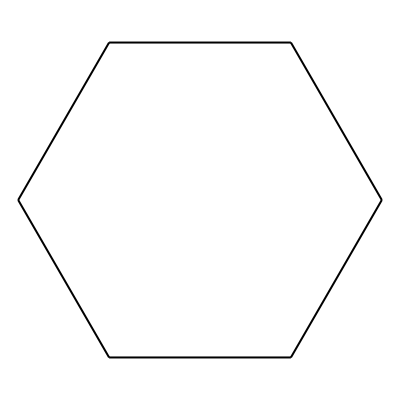
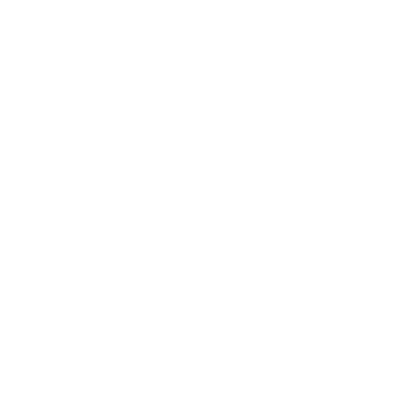
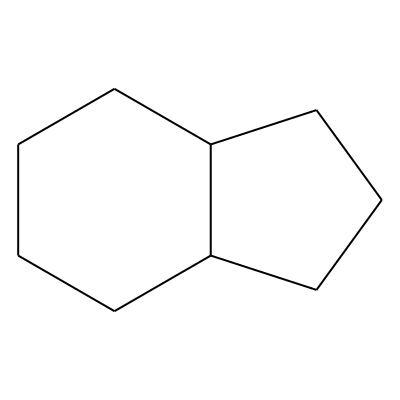
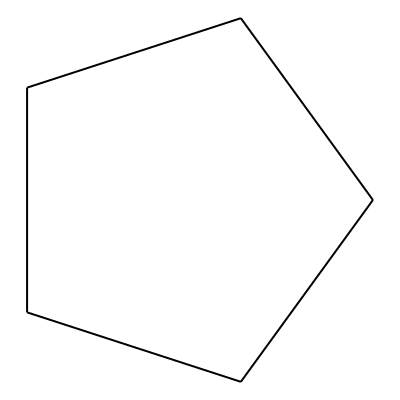
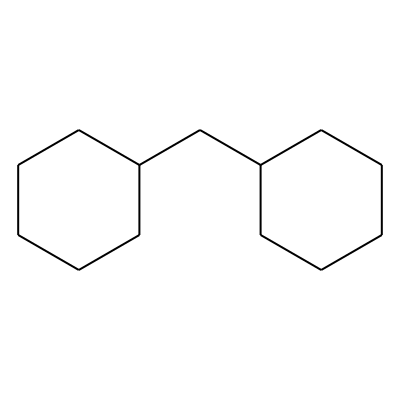

In [24]:
HTML(drugbank_scaffold_counts.head().to_html(formatters = {"molecule": mol2display_png}, escape = False))

In [25]:
drugbank_scaffold_counts["scaffold_probability"] = drugbank_scaffold_counts["scaffold_smiles"].apply(lambda x: (x / len(drugbank_df)) * 100)
drugbank_scaffold_counts

,scaffold_smiles,molecule,scaffold_probability
C1CCCCC1,1039,<rdkit.Chem.rdchem.Mol object at 0x7f8dbdb9ff80>,14.602952
,982,<rdkit.Chem.rdchem.Mol object at 0x7f8dbdb9ff30>,13.801827
C1CCC2CCCC2C1,192,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40c490>,2.698524
C1CCCC1,188,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb40c580>,2.642305
C1CCC(CC2CCCCC2)CC1,182,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd977300>,2.557976
...,...,...,...
C(CCCCC1CCCC1)CCCC1CCCCC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd99a710>,0.014055
C1CCC(CCC2CCCC(CC3CCCC(C4CCCCC4)C3)C2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd99a760>,0.014055
C1CCC(CCC2CCC3CC(CC4CCCC(CC5CCC6CC(CCC7CCCCC7)CCC6C5)C4)CCC3C2)CC1,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd99a7b0>,0.014055
C1CC2CCC1CC2,1,<rdkit.Chem.rdchem.Mol object at 0x7f8dbd99a800>,0.014055


In [26]:
merged_scaffold_counts = pd.merge(data_scaffold_counts, drugbank_scaffold_counts, left_index = True, right_index = True)
merged_scaffold_counts["probability_ratio"] = merged_scaffold_counts["scaffold_probability_x"] / merged_scaffold_counts["scaffold_probability_y"]
merged_scaffold_counts.sort_values("probability_ratio", ascending = False, inplace = True)

,molecule_x,probability_ratio
C1CCC(CCC2CCC(CC3CCCCC4CCCCC43)CC2)CC1,,107.740245
C1CCC(C2CCC(CC3CCCCC4CCCCC43)CC2)C1,,87.020967
C1CCC2C(C1)CCC2CC1CCC2(CC1)CCC1CCCCC12,,58.013978
C1CCCCC(CC2CCCCC2)CCC(CC2CCCCC2)CCCCCCCC(CC2CCCC2)CCC1,,56.632693
C1CCC(CC2CCCC(C3CC4CCCCC4C3)C2)CC1,,33.150844

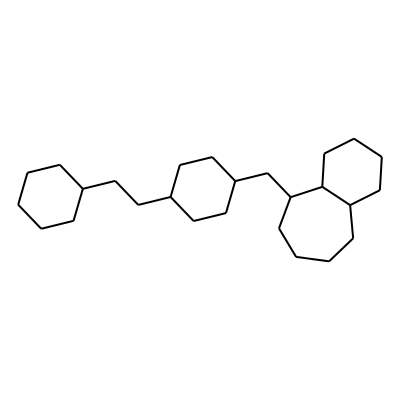
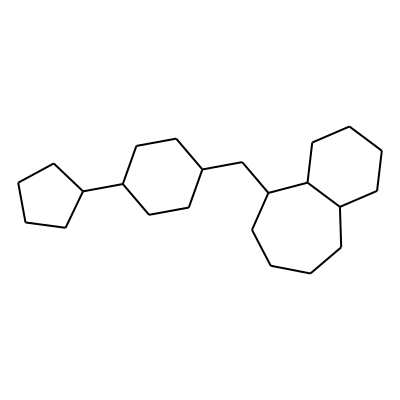
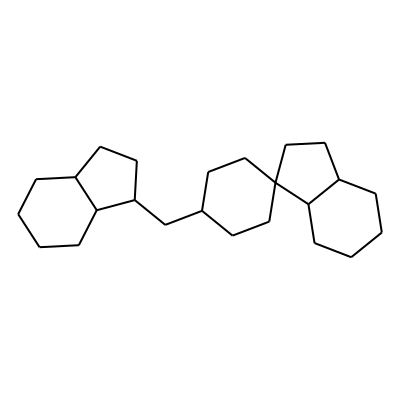
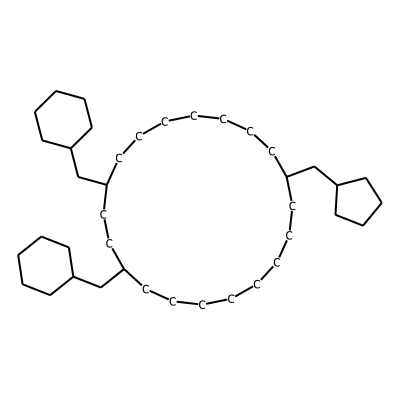
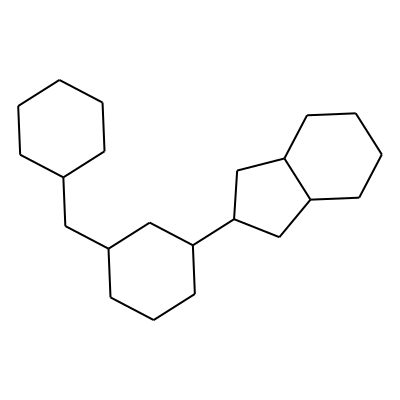

In [27]:
# scaffolds more common in vasopressin dataset
HTML(merged_scaffold_counts[["molecule_x", "probability_ratio"]].head().to_html(formatters = {"molecule_x": mol2display_png}, escape = False))

,molecule_x,probability_ratio
C1CCC2C(C1)CCC1CCCCC12,,0.230214
C1CCC(CCC2CCC(CC3CCCCC3)CC2)CC1,,0.218098
C1CCC(CC2CCC3CCCCC3C2)CC1,,0.188357
C1CCC(CC2CCCC3CCCCC32)CC1,,0.159379
C1CCC2C(C1)CCC2C1CCCC1,,0.074889

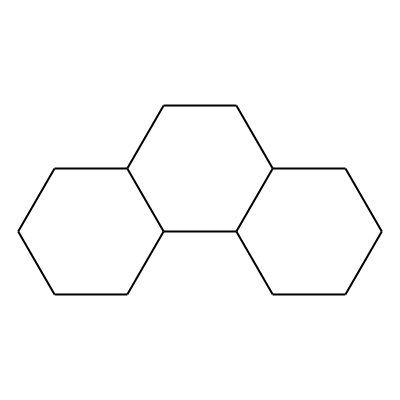
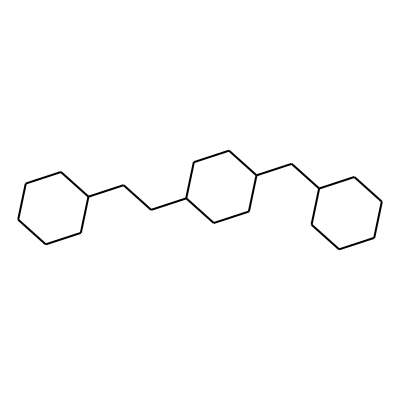
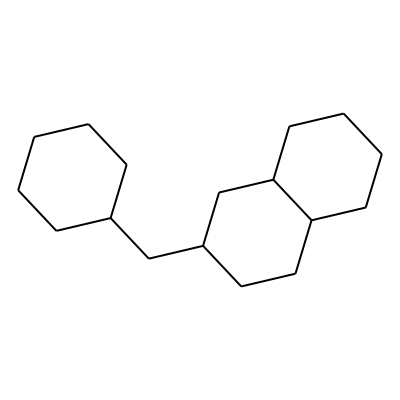
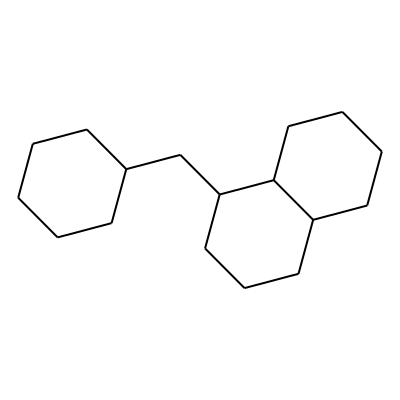
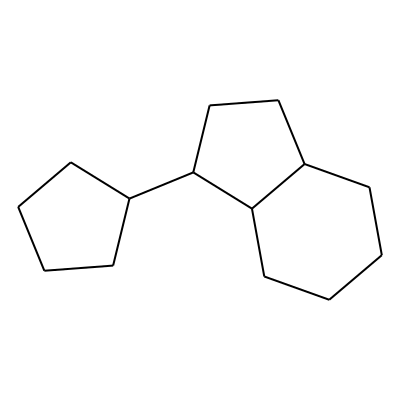

In [28]:
# scaffolds more common in DrugBank dataset
HTML(merged_scaffold_counts[["molecule_x", "probability_ratio"]].tail().to_html(formatters = {"molecule_x": mol2display_png}, escape = False))

,molecule_x,probability_ratio
C1CCC(CCC2CCC(CC3CCCCC4CCCCC43)CC2)CC1,,107.740245
C1CCC(C2CCC(CC3CCCCC4CCCCC43)CC2)C1,,87.020967
C1CCC2C(C1)CCC2CC1CCC2(CC1)CCC1CCCCC12,,58.013978
C1CCCCC(CC2CCCCC2)CCC(CC2CCCCC2)CCCCCCCC(CC2CCCC2)CCC1,,56.632693
C1CCC(CC2CCCC(C3CC4CCCCC4C3)C2)CC1,,33.150844
C1CCCCCC(CC2CCCCC2)CCCCCCCC(CC2CCCC2)CCCCC1,,29.006989
C1CCC(CC2CCC(C3CCCC3C3CCCCC3)CC2)CC1,,22.791206
C1CCC(CCCC(CC2CCCCC2)C2CCCCC2)CC1,,20.719278
C1CCC(CC(CC2CCC(C3CCCCC3)CC2)C2CCCCC2)CC1,,16.575422
C1CCC(C2CCC(CC3CCC4CCCCC43)CC2)CC1,,8.287711

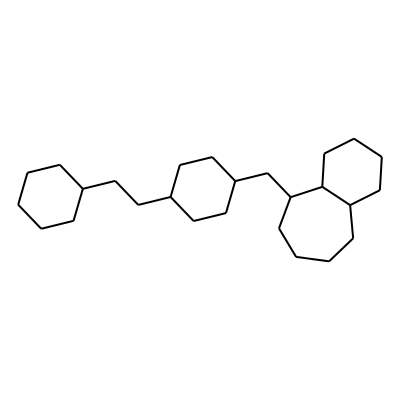
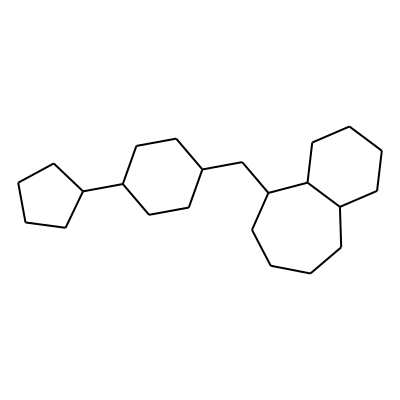
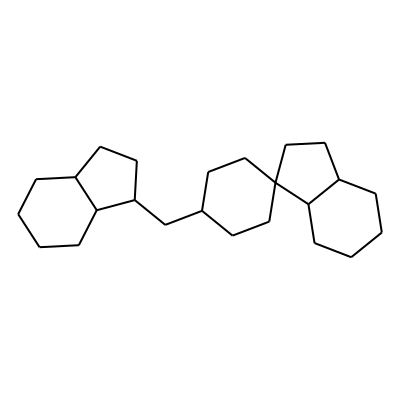
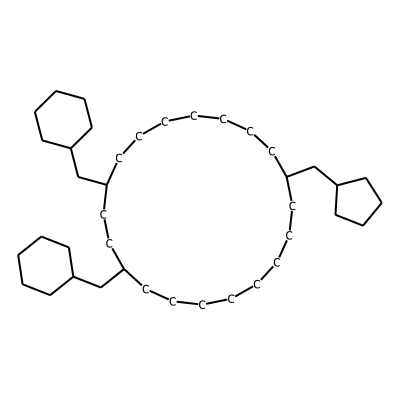
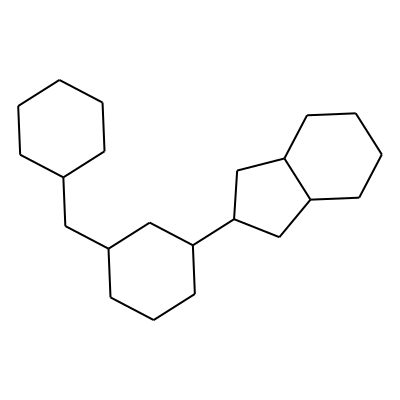
...
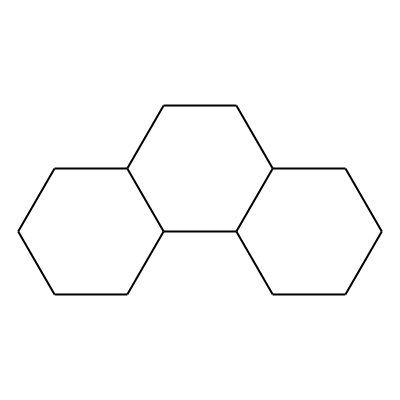
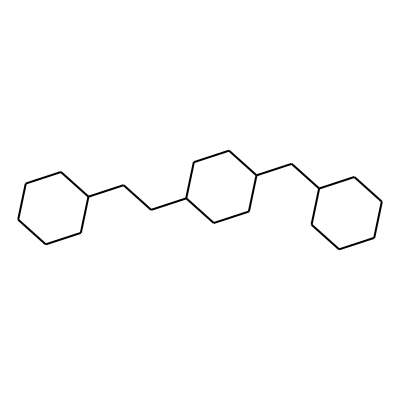
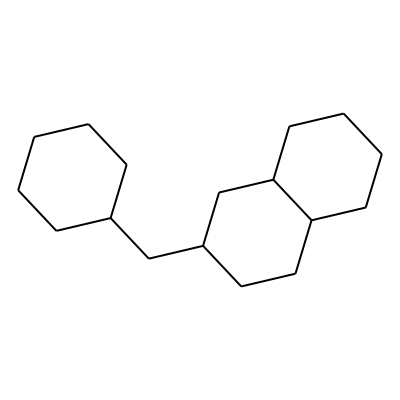
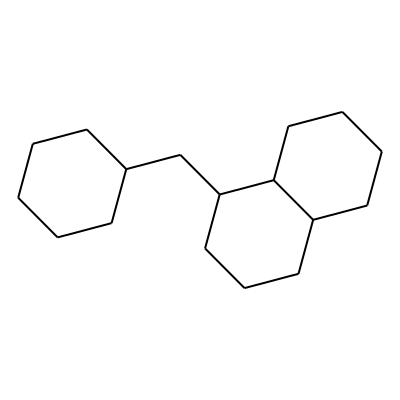
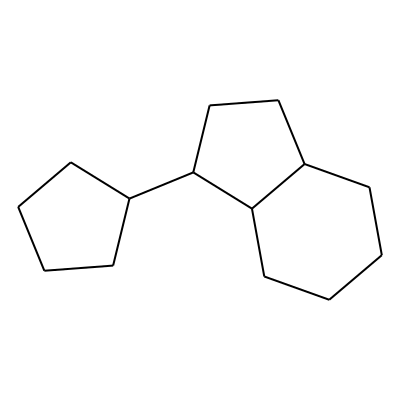

In [29]:
HTML(merged_scaffold_counts[["molecule_x", "probability_ratio"]].to_html(formatters = {"molecule_x": mol2display_png}, escape = False))

## Scaffold diversity picking based on activity

In [36]:
data.loc[data["scaffold_smiles"] == "C1CCC(CCC2CCC(CC3CCCCC4CCCCC43)CC2)CC1"].sort_values("pChEMBL Value").head(1)

,Molecule ChEMBL ID,Molecule Name,Molecule Max Phase,Molecular Weight,#RO5 Violations,AlogP,Compound Key,Smiles,Standard Type,Standard Relation,...,Document Year,Cell ChEMBL ID,Properties,molecule,morgan_fingerprint,scaffold,scaffold_generic,scaffold_scaffold_generic,scaffold_smiles,top_ten_scaffolds
33,CHEMBL510500,NaN,0,587.03,2,6.10,1o,Cc1ccn(-c2ccc(C(=O)N3CCC(F)(F)/C(=C\C(=O)NCc4n...,Ki,'=',...,2009.0,CHEMBL3308072,NaN,<rdkit.Chem.rdchem.Mol object at 0x7f8ddd988df0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",<rdkit.Chem.rdchem.Mol object at 0x7f8ddd9488a0>,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb3d0990>,<rdkit.Chem.rdchem.Mol object at 0x7f8dcb1b8f80>,C(CCC1CCCC(CC2CCC(C3CCCC3)CC2)C2CCCCC21)CC1CC2...,False


In [42]:
data.loc[data["scaffold_smiles"] == "C(CCC1CCCC(CC2CCC(C3CCCC3)CC2)C2CCCCC21)CC1CC2CCCCC2C1"].sort_values("pChEMBL Value", ascending = False).head(1)["pChEMBL Value"]

351    7.26
Name: pChEMBL Value, dtype: float64

In [44]:
# approach 1: group by scaffold, select max
most_active_scaffolds = pd.DataFrame(data.groupby("scaffold_smiles")["pChEMBL Value"].max())

In [53]:
most_active_scaffolds.head()

,pChEMBL Value
scaffold_smiles,
,NaN
C(CCC1CCCC(CC2CCC(C3CCCC3)CC2)C2CCCCC21)CC1CC2CCCCC2C1,7.26
C(CCC1CCCC2CCCCC12)CCC1CCCC2CCCCC12,NaN
C(CCCC(CCC(CCCCC1CCCCC1)CC1CCCCC1)CC1CCCCC1)CCCC(CCC1CCCC1)CC1CCC2C(CCC23C2CCCCC2CC2CCCCC23)C1,8.89
C(CCCC(CCC(CCCCC1CCCCC1)CC1CCCCC1)CC1CCCCC1)CCCC(CCC1CCCC1)CC1CCC2CCC3(C4CCCCC4CC4CCCCC43)C2C1,8.48


In [54]:
most_active_scaffolds.dropna(inplace = True)
most_active_scaffolds.shape

(210, 1)

In [58]:
most_active_molecules = pd.merge(data, most_active_scaffolds, on = ["scaffold_smiles", "pChEMBL Value"])

,molecule,scaffold_scaffold_generic,pChEMBL Value
0,,,10.00
1,,,6.10
2,,,9.82
3,,,8.11
4,,,6.59
5,,,7.41
6,,,10.05
7,,,7.00
8,,,7.20
9,,,6.67

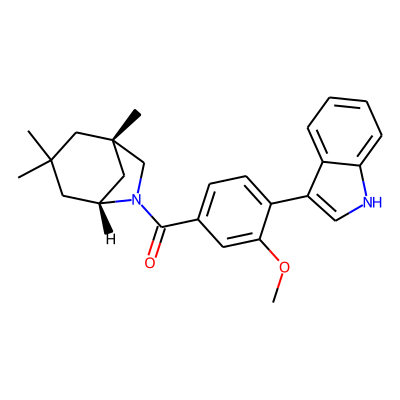
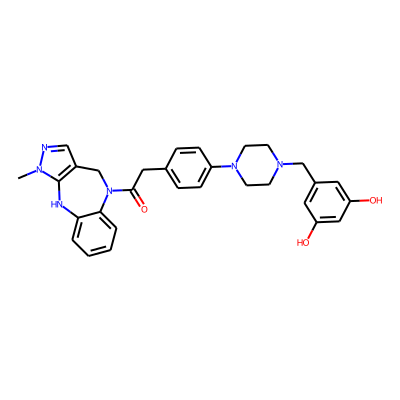
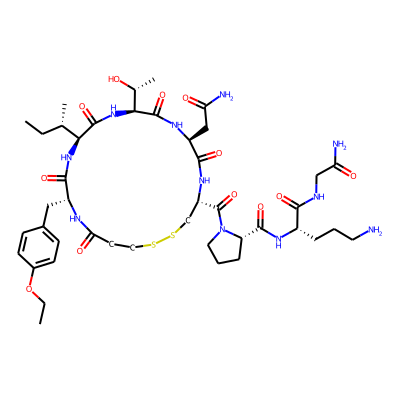
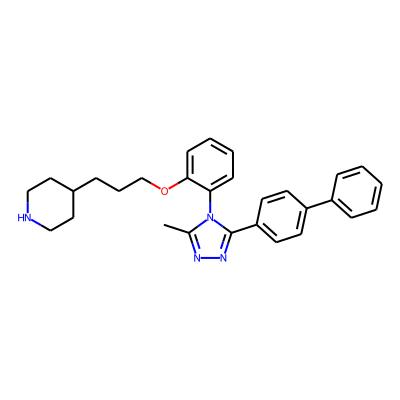
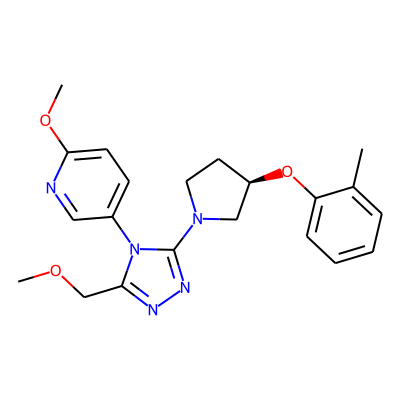
...
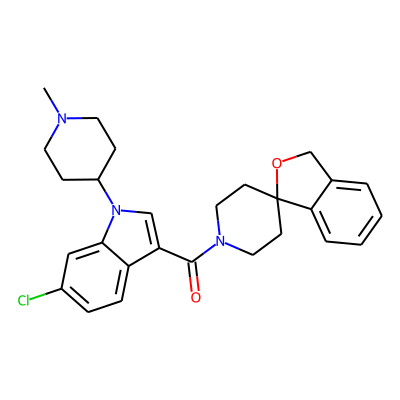
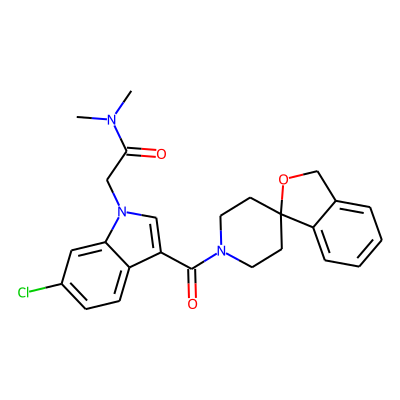
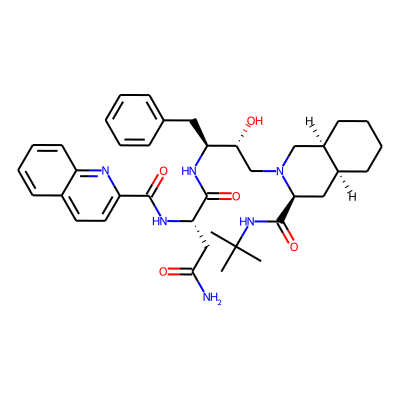
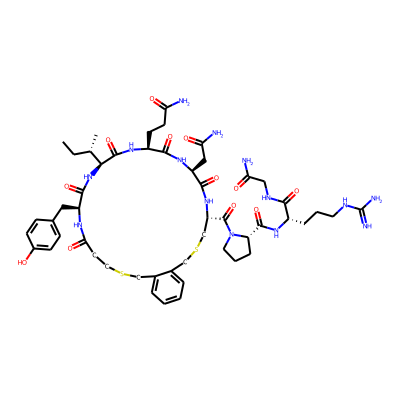
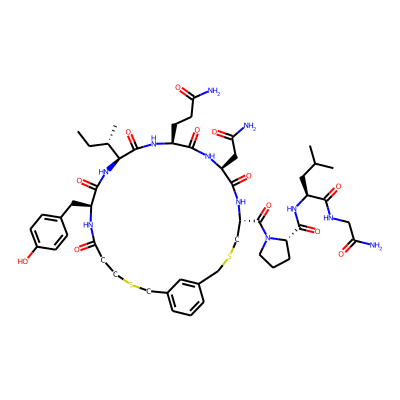

In [66]:
HTML(most_active_molecules[["molecule", "scaffold_scaffold_generic", "pChEMBL Value"]].to_html(formatters = {"molecule": mol2display_png}, escape = False))

In [60]:
len(most_active_molecules["scaffold_smiles"])

226

In [61]:
len(most_active_molecules["scaffold_smiles"].unique())
# there are more molecules with the same scaffold that have all have max pChEMBL value

210

## Clustering

In [178]:
# upload the drugbank dataset
drugbank = [m for m in Chem.SDMolSupplier("../data/drugbank.sdf") if m]

[13:36:36] Explicit valence for atom # 7 N, 4, is greater than permitted
RDKit ERROR: [13:36:36] Explicit valence for atom # 7 N, 4, is greater than permitted
RDKit ERROR: [13:36:36] ERROR: Could not sanitize molecule ending on line 20009
[13:36:36] ERROR: Could not sanitize molecule ending on line 20009
RDKit ERROR: [13:36:36] ERROR: Explicit valence for atom # 7 N, 4, is greater than permitted
[13:36:36] ERROR: Explicit valence for atom # 7 N, 4, is greater than permitted
[13:36:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10

RDKit ERROR: [13:36:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10
RDKit ERROR: 
RDKit ERROR: [13:36:37] ERROR: Could not sanitize molecule ending on line 250947
[13:36:37] ERROR: Could not sanitize molecule ending on line 250947
RDKit ERROR: [13:36:37] ERROR: Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10
[13:36:37] ERROR: Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10

[13:36:37] Explicit valence for atom

RDKit ERROR: [13:36:38] ERROR: Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
RDKit ERROR: 
RDKit ERROR: [13:36:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
RDKit ERROR: 
RDKit ERROR: [13:36:38] ERROR: Could not sanitize molecule ending on line 378618
[13:36:38] ERROR: Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7

[13:36:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9

[13:36:38] ERROR: Could not sanitize molecule ending on line 378618
RDKit ERROR: [13:36:38] ERROR: Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[13:36:38] ERROR: Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9

[13:36:38] Explicit valence for atom # 56 O, 3, is greater than permitted
RDKit ERROR: 
RDKit ERROR: [13:36:38] Explicit valence for atom # 56 O, 3, is greater than permitted
RDKit ERROR: [13:36:38] ERROR: Could not sanitize molecule ending on line 398455
[13:36:38] ERROR: Could not sanitize molecule ending on line 398455
RDKit ERROR: [13:36:38] ERROR: 

RDKit ERROR: [13:36:39] ERROR: Explicit valence for atom # 2 O, 3, is greater than permitted
[13:36:39] ERROR: Explicit valence for atom # 2 O, 3, is greater than permitted
[13:36:39] Explicit valence for atom # 6 B, 4, is greater than permitted
RDKit ERROR: [13:36:39] Explicit valence for atom # 6 B, 4, is greater than permitted
RDKit ERROR: [13:36:39] ERROR: Could not sanitize molecule ending on line 541262
[13:36:39] ERROR: Could not sanitize molecule ending on line 541262
RDKit ERROR: [13:36:39] ERROR: Explicit valence for atom # 6 B, 4, is greater than permitted
[13:36:39] ERROR: Explicit valence for atom # 6 B, 4, is greater than permitted
[13:36:39] Can't kekulize mol.  Unkekulized atoms: 2 3 17 19 20

RDKit ERROR: [13:36:39] Can't kekulize mol.  Unkekulized atoms: 2 3 17 19 20
RDKit ERROR: 
RDKit ERROR: [13:36:39] ERROR: Could not sanitize molecule ending on line 557517
RDKit ERROR: [13:36:39] ERROR: Can't kekulize mol.  Unkekulized atoms: 2 3 17 19 20
[13:36:39] ERROR: Could n

RDKit ERROR: [13:36:39] Explicit valence for atom # 4 F, 2, is greater than permitted
RDKit ERROR: [13:36:39] ERROR: Could not sanitize molecule ending on line 645068
[13:36:39] ERROR: Explicit valence for atom # 17 Mg, 4, is greater than permitted
[13:36:39] Explicit valence for atom # 4 F, 2, is greater than permitted
[13:36:39] ERROR: Could not sanitize molecule ending on line 645068
RDKit ERROR: [13:36:39] ERROR: Explicit valence for atom # 4 F, 2, is greater than permitted
[13:36:39] ERROR: Explicit valence for atom # 4 F, 2, is greater than permitted
[13:36:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 5 6 7 8 9 10

RDKit ERROR: [13:36:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 5 6 7 8 9 10
RDKit ERROR: 
RDKit ERROR: [13:36:39] ERROR: Could not sanitize molecule ending on line 659994
[13:36:39] ERROR: Could not sanitize molecule ending on line 659994
RDKit ERROR: [13:36:39] ERROR: Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 5 6 7 8 9 10
[13:36:39] ERROR: Can't 

In [179]:
# create the drugbank dataframe
drugbank_morgan_fingerprint = [Chem.GetMorganFingerprintAsBitVect(m, 2, nBits = 1024) for m in drugbank]
drugbank_formulas = [m.GetProp("FORMULA") for m in drugbank]
drugbank_generics = [m.GetProp("GENERIC_NAME") for m in drugbank]

drugbank_df = pd.DataFrame([drugbank_formulas, drugbank_generics, drugbank, drugbank_morgan_fingerprint]).transpose()
drugbank_df.columns = ["formula", "generic_name", "molecule", "morgan_fingerprint"]

In [180]:
# combine the dataframes
data["source"] = "vasopressin"
drugbank_df["source"] = "drugbank"

combined_df = data.append(drugbank_df, ignore_index = True)

In [181]:
# approach from the last exercise
sparse_mat = distance.pdist(list(combined_df["morgan_fingerprint"]), metric = "jaccard")
dist_mat = distance.squareform(sparse_mat)
dist_mat = pd.DataFrame(dist_mat)

In [75]:
# my approach
similarity_matrix = pd.read_csv("vasopressin_self_similarity_matrix.csv", index_col = 0)
distance_matrix = 1 - similarity_matrix

### t-SNE

In [182]:
clf = TSNE(n_components = 2, metric = "precomputed")
tsne = clf.fit_transform(dist_mat)

/Users/katerina/Applications/miniconda3/envs/pocitacovy_navrh_leciv/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/Users/katerina/Applications/miniconda3/envs/pocitacovy_navrh_leciv/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/Users/katerina/Applications/miniconda3/envs/pocitacovy_navrh_leciv/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning,


In [183]:
combined_df[["tsne_x", "tsne_y"]] = tsne.tolist()

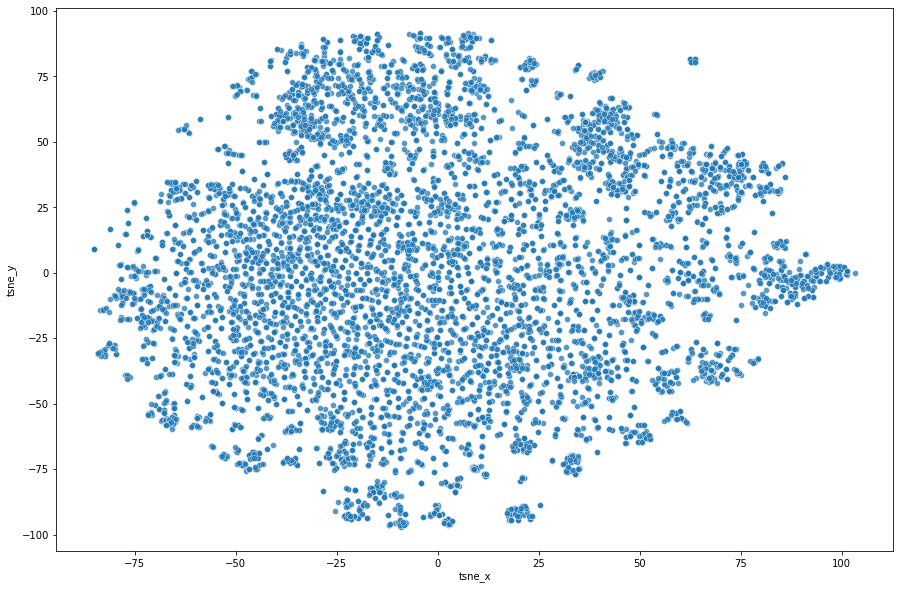

In [184]:
fig, ax = plt.subplots(figsize = (15, 10))
plot = sns.scatterplot(x = "tsne_x", y = "tsne_y", data = combined_df, legend = "brief", ax = ax, alpha = 0.75)

In [185]:
clustering = AgglomerativeClustering(n_clusters = 7).fit(combined_df[["tsne_x", "tsne_y"]])

In [186]:
clustering.labels_

array([0, 0, 0, ..., 1, 3, 5])

In [187]:
combined_df["cluster"] = clustering.labels_

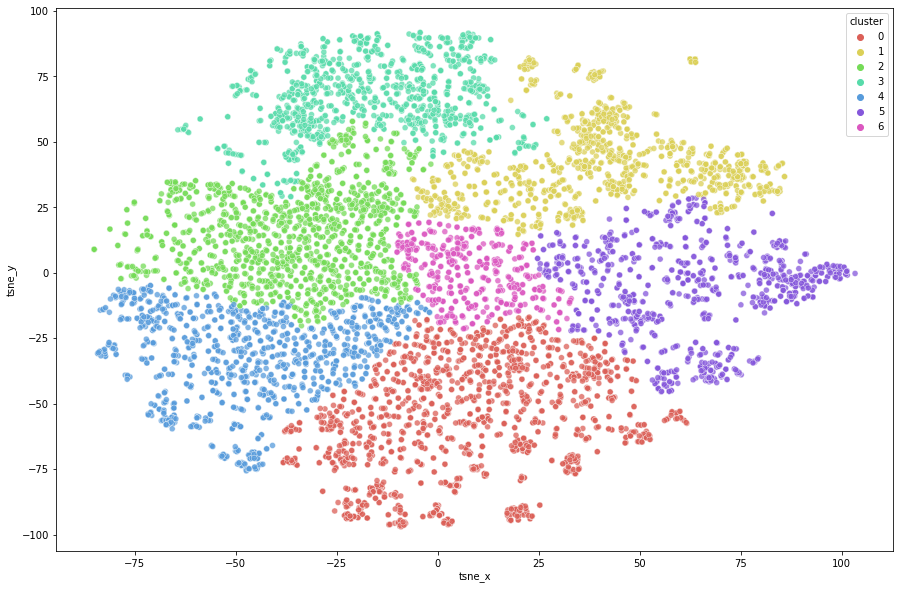

In [188]:
fig, ax = plt.subplots(figsize = (15, 10))
plot = sns.scatterplot(x = "tsne_x", y = "tsne_y", data = combined_df, hue = "cluster", legend = "brief", ax = ax, alpha = 0.75, palette = sns.color_palette("hls", 7))

### PCA

In [191]:
MQNs_column_names = ["MQN" + str(i) for i in list(range(1, 43))]
combined_df[MQNs_column_names] = combined_df["molecule"].apply(MQNs_).to_list()

In [192]:
combined_df[MQNs_column_names]

,MQN1,MQN2,MQN3,MQN4,MQN5,MQN6,MQN7,MQN8,MQN9,MQN10,...,MQN33,MQN34,MQN35,MQN36,MQN37,MQN38,MQN39,MQN40,MQN41,MQN42
0,26,0,0,0,0,0,0,0,1,2,...,0,0,2,3,0,0,0,0,5,3
1,26,0,0,0,0,0,0,0,2,2,...,0,0,2,3,0,0,0,0,5,3
2,30,0,0,0,0,0,0,0,6,3,...,0,0,1,4,1,0,0,0,4,2
3,43,0,0,0,0,2,0,5,6,12,...,0,0,1,1,0,0,0,1,0,0
4,25,0,0,0,0,0,0,0,1,2,...,0,0,1,3,0,0,0,0,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8827,6,0,1,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0
8828,15,0,0,0,0,0,0,0,0,7,...,0,0,0,3,0,0,0,0,2,1
8829,52,0,0,0,0,0,0,6,4,16,...,0,0,2,4,0,0,0,0,2,1
8830,14,0,0,0,0,1,0,0,0,5,...,0,0,0,0,0,0,0,0,0,0


In [193]:
pca_pipeline = Pipeline([("scaling", StandardScaler()), ("pca", PCA(n_components = 6))])
# pca_pipeline = Pipeline([("normalizing", Normalizer()), ("pca", PCA(n_components = 6))])
pca = pca_pipeline.fit_transform(combined_df[MQNs_column_names])

In [194]:
pca_df = pd.DataFrame(pca)

In [195]:
pca_df.shape

(8832, 6)

In [196]:
pca_column_names = ["PCA" + str(i) for i in list(range(1, 7))]

In [197]:
pca_df.columns = pca_column_names

In [198]:
combined_df[pca_column_names] = pca_df
combined_df[pca_column_names]

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6
0,0.020405,-2.919654,0.439861,-0.394859,-0.294090,1.154139
1,0.048314,-2.813349,0.031159,-0.278247,-0.277831,0.995271
2,1.560021,-3.946757,-2.122436,0.872269,0.030573,-0.845174
3,8.295015,1.663544,-1.173840,-0.429885,-0.540281,-0.972457
4,-0.597864,-1.987529,0.013325,-0.568892,-0.162629,1.077882
...,...,...,...,...,...,...
8827,-3.451631,0.376837,0.134159,-0.504555,-0.178351,-0.313178
8828,0.236758,-0.514819,1.280463,-0.508391,-0.593911,-0.094410
8829,10.020897,0.776710,-1.817458,-0.746626,-0.404726,-0.052435
8830,-1.018121,3.100867,1.067496,0.712338,2.646727,0.345350


In [199]:
pca_clustering = AgglomerativeClustering(n_clusters = 10).fit(pca)

In [201]:
combined_df["pca_cluster"] = pca_clustering.labels_

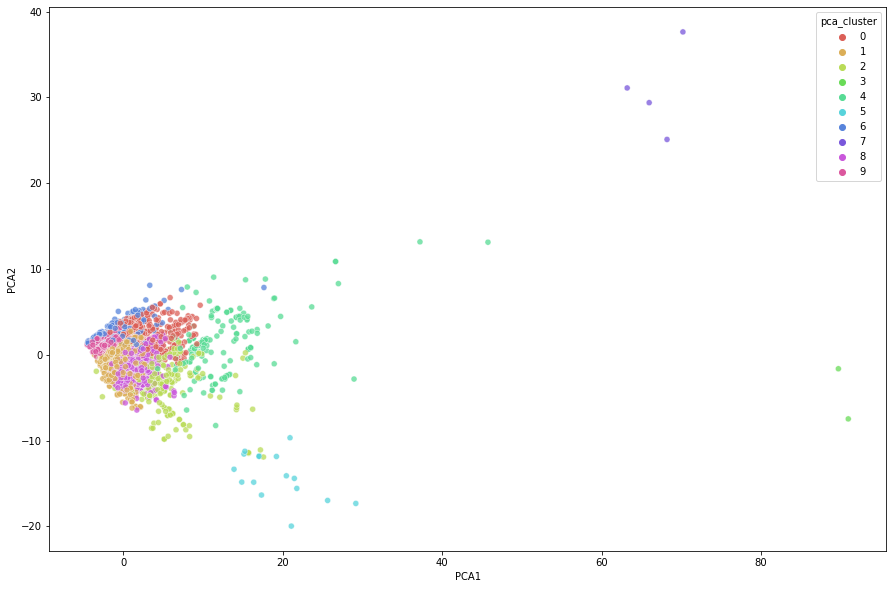

In [202]:
fig, ax = plt.subplots(figsize = (15, 10))
plot = sns.scatterplot(x = "PCA1", y = "PCA2", data = combined_df, hue = "pca_cluster", legend = "brief", ax = ax, alpha = 0.75, palette = sns.color_palette("hls", 10))

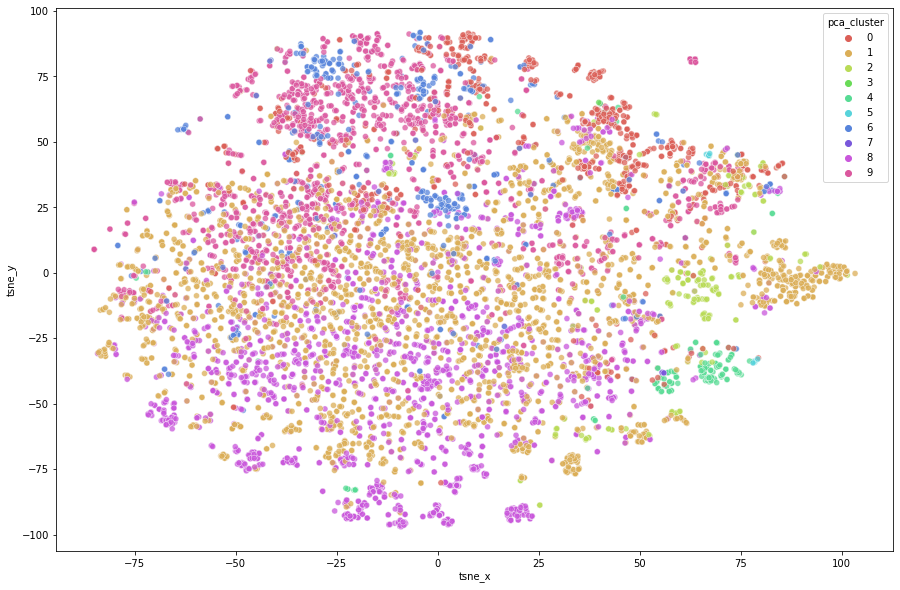

In [203]:
fig, ax = plt.subplots(figsize = (15, 10))
plot = sns.scatterplot(x = "tsne_x", y = "tsne_y", data = combined_df, hue = "pca_cluster", legend = "brief", ax = ax, alpha = 0.75, palette = sns.color_palette("hls", 10))

In [206]:
combined_df[["source", "pca_cluster"]].groupby(["pca_cluster", "source"]).size()

pca_cluster  source     
0            drugbank        801
             vasopressin      27
1            drugbank       2724
             vasopressin     568
2            drugbank        168
             vasopressin      55
3            drugbank          2
4            drugbank         74
             vasopressin     121
5            drugbank         11
             vasopressin       6
6            drugbank        452
             vasopressin      40
7            drugbank          4
8            drugbank       1368
             vasopressin     700
9            drugbank       1511
             vasopressin     200
dtype: int64